#**NN to classify pixels in LandSat8 RAW images as Land, Water, Cloud, and Blank**

# This is an Example Notebook on how to traina  NN to do pixel-by-pixel classification in remote sensing images. The NN is trained on RAW images and masks for Cloud, Water, land and Blank as provided by LandSat8. These Masks provided by LandSat8 are computed on SR images. This NN can be used on RAW images to remuve the need to go from RAW to SR images (an extremely computationally expensive process!)


**Mounting Google Drive**

We mount the google drive

In [1]:
from google.colab import drive
drive.mount('/content/drive')
%cd /content/drive/MyDrive/TinyMLDrive/

Mounted at /content/drive
/content/drive/.shortcut-targets-by-id/1CTqSzBrCYC0m9cNgwEZtlymQ-3SMJG99/TinyMLDrive


Import the necessary labriaries

In [2]:
%pip -q install rasterio
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras import layers
import absl.logging
absl.logging.set_verbosity(absl.logging.ERROR)
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import RobustScaler
from imblearn.under_sampling import RandomUnderSampler
import glob
import os
import rasterio
from matplotlib import colors
from tqdm import tqdm

#This stops the excessive warnings
from rasterio import logging
log = logging.getLogger()
log.setLevel(logging.ERROR)

#Importing the tinyML toolkit


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 49.5 MB/s eta 0:00:00


Defining functions and Classes for loading the training data, and scale the images and the data

In [3]:
#This loads in the training data from the googledrive folder and returns the training data arrays
def load_data(path):
    X = []
    y = []

    for file in glob.glob(path+'/*.npz'):
        data = np.load(file)
        X.extend(data['X'])
        y.extend(data['y'])
    return np.array(X), np.array(y)

#This scales the image colours so that it looks nice
def scale_im(reader):
    red = reader.read(3)
    green = reader.read(2)
    blue = reader.read(1)
    scale = lambda x : (x*0.0000275) - 0.2
    return np.dstack([scale(red), scale(green), scale(blue)]) * 3

#This is just a simple normalising class
class SimpleScaler:
    def fit(self, X):
        self.min = np.min(X)
        self.max = np.max(X)

    def transform(self, X):
        return (X - self.min) / (self.max - self.min)

    def fit_transform(self, X):
        self.fit(X)
        return self.transform(X)



## Building the NN

This neural network will take in a pixel with information on 6 Landsat bands and predict if a given pixel is cloud, blank, land or water.

### Collecting the training data and preprocessing it

You can download the training set I built for this task from here: https://drive.google.com/drive/folders/1bjhf60bt3-dFgXByOCYMSH_OSQj0EvSh?usp=sharing

This dataset contains many locations and it's downloaded as in the Examples in this repository, combining EarthEngineAPI.ipynb and CloudWaterMask.ipynb

In [4]:
X_data, y_data = load_data("/content/drive/MyDrive/TinyML/Satellite/TrainingSetAllFilters/") # You can download it from the link above

In [5]:
X_data = X_data.reshape(-1, X_data.shape[-1]) # we reshape the array

In [6]:
y_data = y_data.flatten().astype(np.int32) # we convert y into int


In [7]:
X_under_data, y_under_data = RandomUnderSampler().fit_resample(X_data, y_data) # we undersample the dataset

scale_img = SimpleScaler()

X_scaled_data = scale_img.fit_transform(X_under_data) # we apply a simple scaler to the dataset

X_train, X_test, y_train, y_test = train_test_split(X_scaled_data, y_under_data, test_size=0.2)

In [8]:
np.shape(X_train) #this gives us the dimension of X_train

(6433756, 6)

We now define the structure of the NN

In [9]:
# Defining the networl layers and nodes
BCLWMasks = tf.keras.Sequential([
    layers.Input(shape=np.shape(X_train[0,:])), # 6, as the filters
    layers.Dense(128, activation='relu'),
    layers.Dense(64, activation='relu'),
    layers.Dense(64, activation='relu'),
    layers.Dense(64, activation='relu'),
    layers.Dense(64, activation='relu'),
    layers.Dense(28, activation='relu'),

    layers.Dense(4, activation='softmax') # 4, as the categories
])

# Compiling the network and assigning the metrics to assess the models performance on
BCLWMasks.compile(
    loss= tf.keras.losses.SparseCategoricalCrossentropy(),
optimizer='adam',     metrics=['accuracy']
)


In [10]:
# Training the network to predict Land, Water, Cloud, Blank
BCLWMasks.fit(
    X_train,
    y_train,
    epochs=15,
    batch_size=264,
    validation_split=0.2,
)

Epoch 1/15
19497/19497 ━━━━━━━━━━━━━━━━━━━━ 126s 6ms/step - accuracy: 0.9528 - loss: 0.1141 - val_accuracy: 0.9707 - val_loss: 0.0692
Epoch 2/15
19497/19497 ━━━━━━━━━━━━━━━━━━━━ 135s 6ms/step - accuracy: 0.9757 - loss: 0.0602 - val_accuracy: 0.9778 - val_loss: 0.0554
Epoch 3/15
19497/19497 ━━━━━━━━━━━━━━━━━━━━ 120s 5ms/step - accuracy: 0.9785 - loss: 0.0537 - val_accuracy: 0.9797 - val_loss: 0.0520
Epoch 4/15
19497/19497 ━━━━━━━━━━━━━━━━━━━━ 141s 5ms/step - accuracy: 0.9799 - loss: 0.0508 - val_accuracy: 0.9815 - val_loss: 0.0474
Epoch 5/15
19497/19497 ━━━━━━━━━━━━━━━━━━━━ 148s 5ms/step - accuracy: 0.9805 - loss: 0.0492 - val_accuracy: 0.9814 - val_loss: 0.0485
Epoch 6/15
19497/19497 ━━━━━━━━━━━━━━━━━━━━ 140s 5ms/step - accuracy: 0.9808 - loss: 0.0482 - val_accuracy: 0.9799 - val_loss: 0.0499
Epoch 7/15
19497/19497 ━━━━━━━━━━━━━━━━━━━━ 100s 5ms/step - accuracy: 0.9811 - loss: 0.0475 - val_accuracy: 0.9821 - val_loss: 0.0458
Epoch 8/15
19497/19497 ━━━━━━━━━━━━━━━━━━━━ 139s 5ms/step - ac

In [ ]:
#RGBMasks.save("/content/drive/MyDrive/TinyML/RGBCloudBalnksNet.h5") # to save it


In [ ]:
#RGBMasksNetSize = os.path.getsize("/content/drive/MyDrive/TinyML/RGBCloudBalnksNet.h5") # to know the size
#print(f"MasksNet: {RGBMasksNetSize/1000} kB")

### Accuracy of this model





In [11]:
# Evaluate the model on the test data
test_loss, test_accuracy = BCLWMasks.evaluate(X_test, y_test)
print(f'Test Loss: {test_loss}')
print(f'Test Accuracy: {test_accuracy}')

50264/50264 ━━━━━━━━━━━━━━━━━━━━ 78s 2ms/step - accuracy: 0.9835 - loss: 0.0421
Test Loss: 0.04246862977743149
Test Accuracy: 0.9833994507789612


In [12]:
# Get predictions
predictions = BCLWMasks.predict(X_test)
predicted_classes = np.argmax(predictions, axis=1)

50264/50264 ━━━━━━━━━━━━━━━━━━━━ 78s 2ms/step


In [13]:
# Calculate accuracy manually
correct_predictions = (predicted_classes == y_test).sum()
accuracy = correct_predictions / len(y_test)
print(f'Accuracy: {accuracy}')

Accuracy: 0.9833994429384995


In [14]:
# Print some example predictions
print(predicted_classes[:10])
print(y_test[:10])

[3 2 0 1 3 0 1 3 0 1]
[3 2 0 1 3 0 1 3 0 1]


#**Let's see the predictions on a different Training set (with no locations in common)**

In [15]:
from matplotlib import colors


In [16]:
cmap_masks = colors.ListedColormap([ 'lightblue', 'blue', 'white', 'black',])


In [17]:
def plot_prediction(path_main_directory):
    if not os.path.isdir(path_main_directory):
        return "Main directory does not exist."

    contents = os.listdir(path_main_directory)
    subdirectories = [d for d in contents if os.path.isdir(os.path.join(path_main_directory, d))]
    print(f"Number of subdirectories: {len(subdirectories)}")

    for subdirectory in subdirectories:
        subdirectory_SR = os.path.join(path_main_directory, subdirectory) + "/SR"
        list_date = os.listdir(subdirectory_SR)

        prediction_count = 0  # To count number of predictions plotted

        for dirpath, dirnames, filenames in os.walk(subdirectory_SR):
            if filenames:
                for filename in filenames:
                    # Limit to 3 predictions per location
                    if prediction_count >= 3:
                        print(f"Reached the limit of 3 predictions for {subdirectory}. Moving to the next location.")
                        break  # Stop plotting more predictions for this location


                    file_path = os.path.join(dirpath, filename)
                    file_path_RAW = file_path.replace("SR", "RAW")
                    # Plotting and image processing starts here
                    if os.path.isfile(file_path_RAW) == True:

                      RAW_reader = rasterio.open(file_path_RAW)
                      image_shape = RAW_reader.read(1).shape
                      raw_image = np.dstack([
                          RAW_reader.read(1),
                          RAW_reader.read(2),
                          RAW_reader.read(3),
                          RAW_reader.read(4),
                          RAW_reader.read(5),
                          RAW_reader.read(6),
                      ])
                      test_image = scale_im(RAW_reader)

                      # Resize the images
                      test_image_water = scale_img.transform(raw_image.reshape((image_shape[0], image_shape[1], 6)))

                      predictions = BCLWMasks(test_image_water.reshape((np.product(image_shape), 6)))
                      predicted_classes = np.argmax(predictions, axis=1)

                      # Plotting
                      fig, ax = plt.subplots(1, 2, dpi=150)
                      ax[0].imshow(test_image)
                      ax[0].title.set_text('RGB Raw image')

                      im = ax[1].imshow(predicted_classes.reshape((image_shape[0], image_shape[1])), cmap=cmap_masks, interpolation="none", vmin=0, vmax=3)
                      cbar = fig.colorbar(im, pad=0.05, fraction=0.046)
                      cbar.set_ticks([0, 1, 2, 3])
                      cbar.set_ticklabels(["land", "water", "cloud", "blank"])

                      ax[1].title.set_text('Keras BCWL Model')

                      plt.show()

                      # Close the figure after displaying it
                      plt.close()

                      # Increment the prediction count
                      prediction_count += 1

                  # If 3 predictions have been plotted, break out of the loop and move to the next subdirectory
                if prediction_count >= 3:
                    break

        print(f"Finished processing location: {subdirectory}")



You can download this Testing Set from here: https://drive.google.com/drive/folders/1CGO2tqotWs1zcKKwkaRmadPLGPGGYEZW?usp=sharing

Number of subdirectories: 17


<ipython-input-18-a461b0c8b869>:1: DeprecationWarning: `product` is deprecated as of NumPy 1.25.0, and will be removed in NumPy 2.0. Please use `prod` instead.
  plot_prediction('/content/drive/MyDrive/TinyML/Satellite/TestingSetAllFilters')


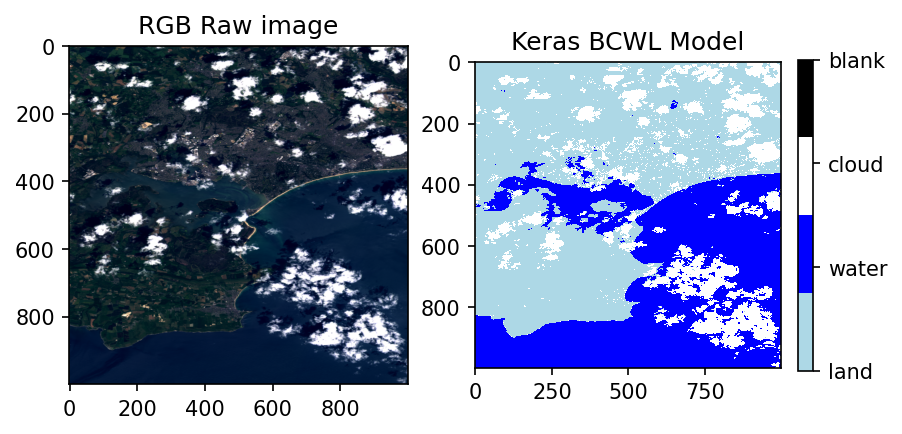

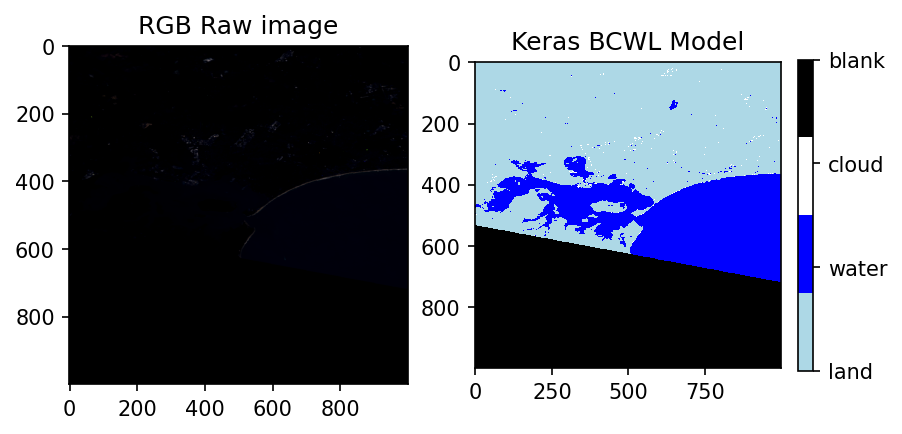

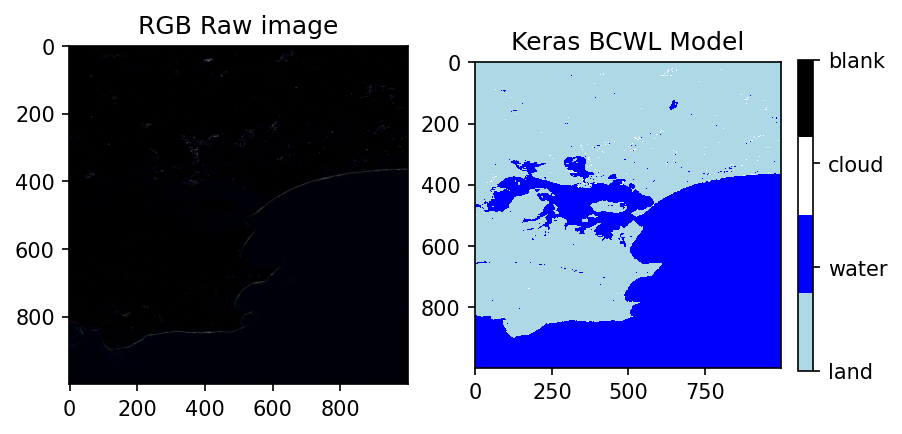

Finished processing location: -1_9547852908433536-50_68440359993335


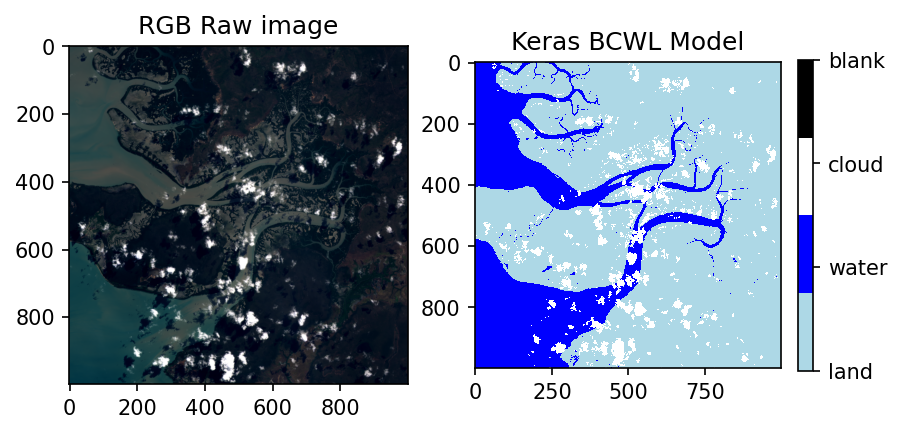

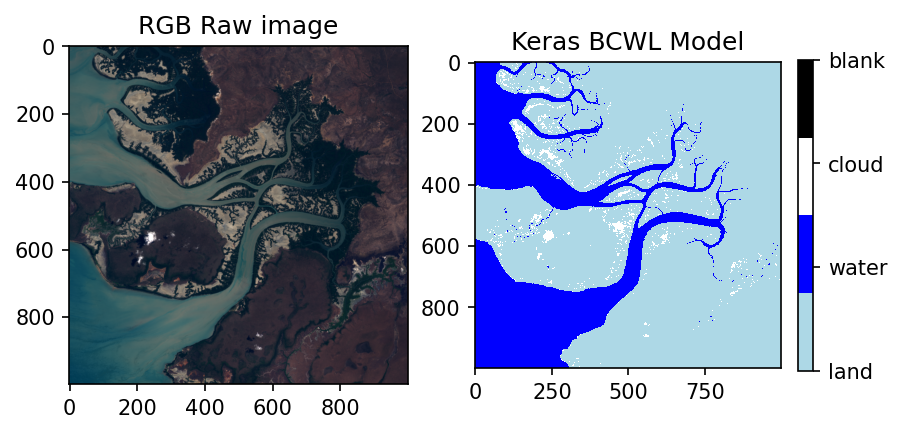

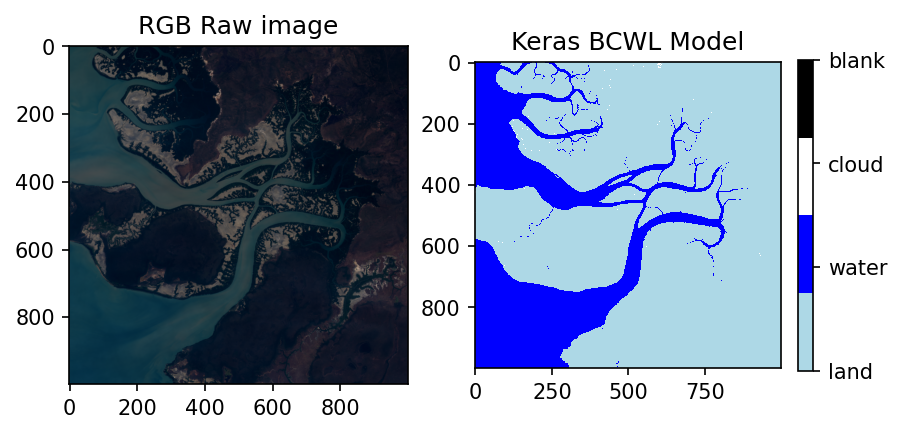

Reached the limit of 3 predictions for 132_64106660214756--11_662221517534109. Moving to the next location.
Finished processing location: 132_64106660214756--11_662221517534109


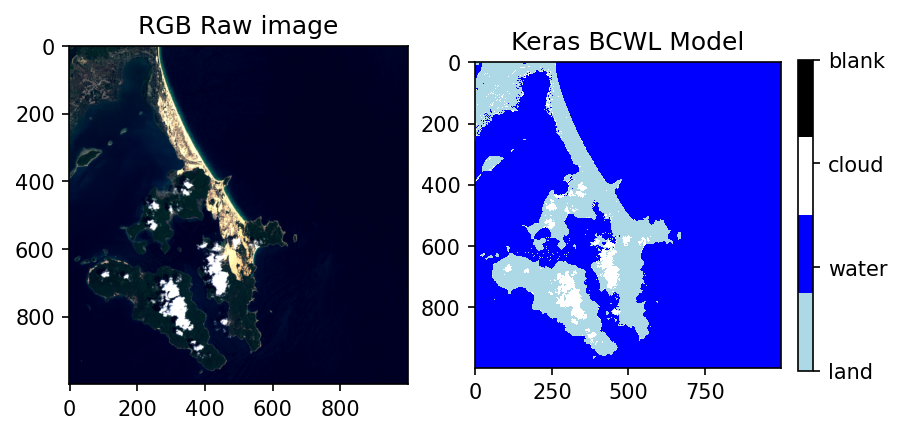

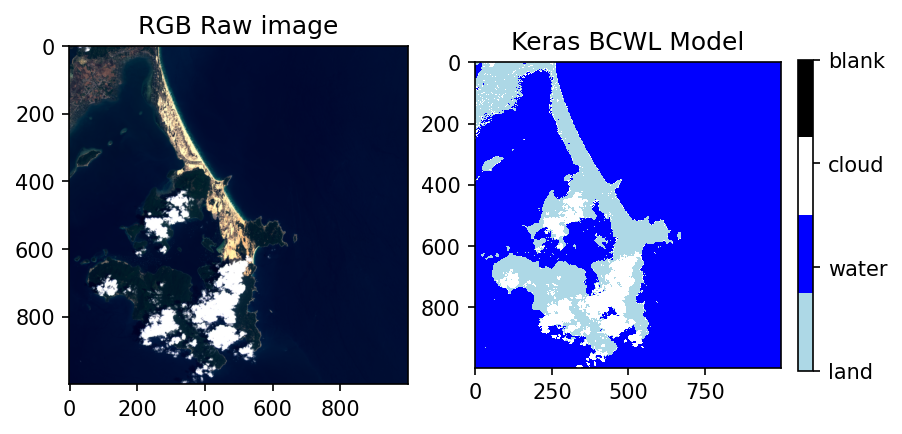

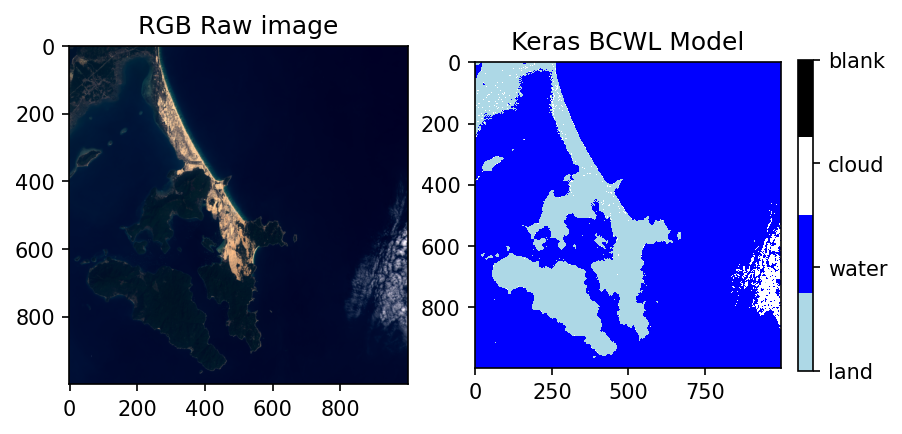

Finished processing location: 109_42243742166109-12_67329465469722


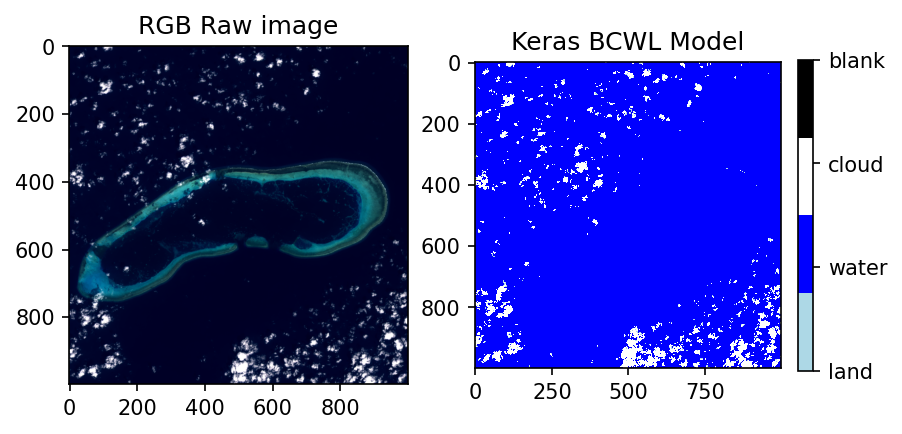

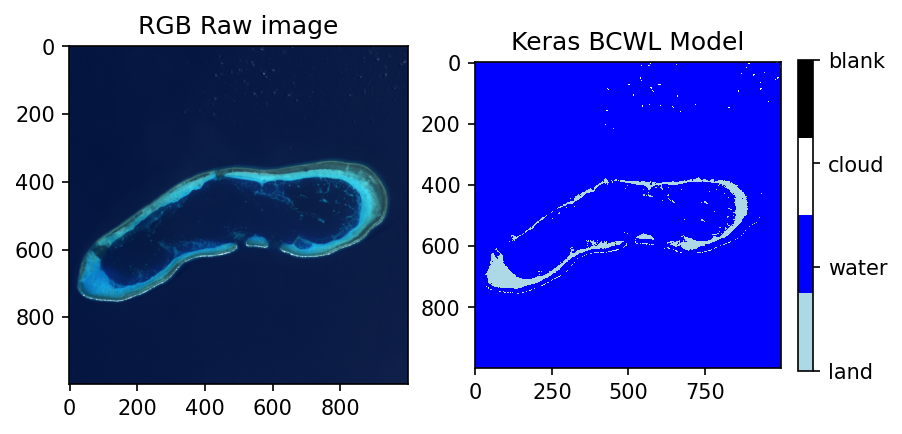

Finished processing location: 111_69543996054527-16_231555482637397


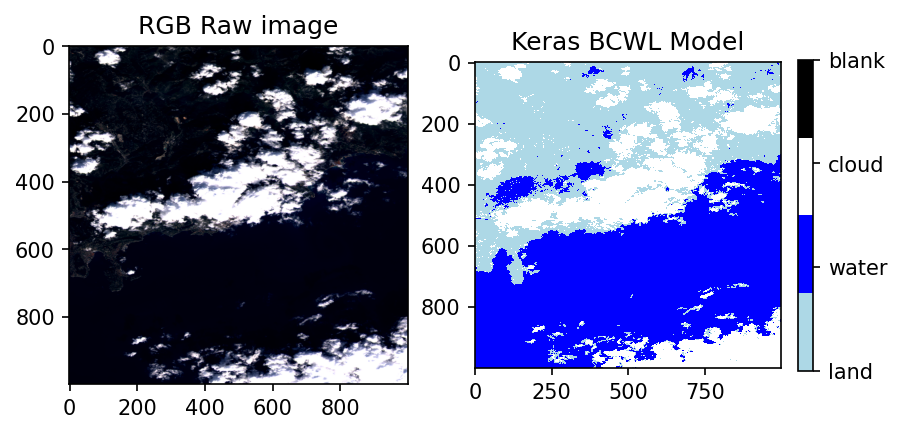

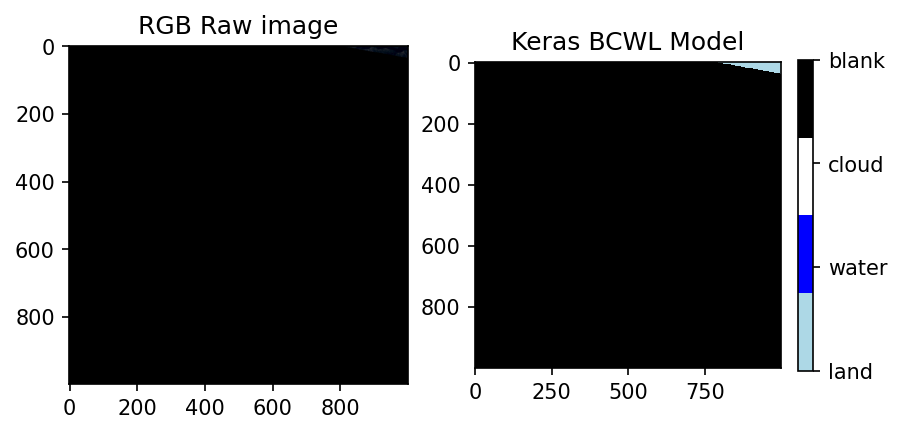

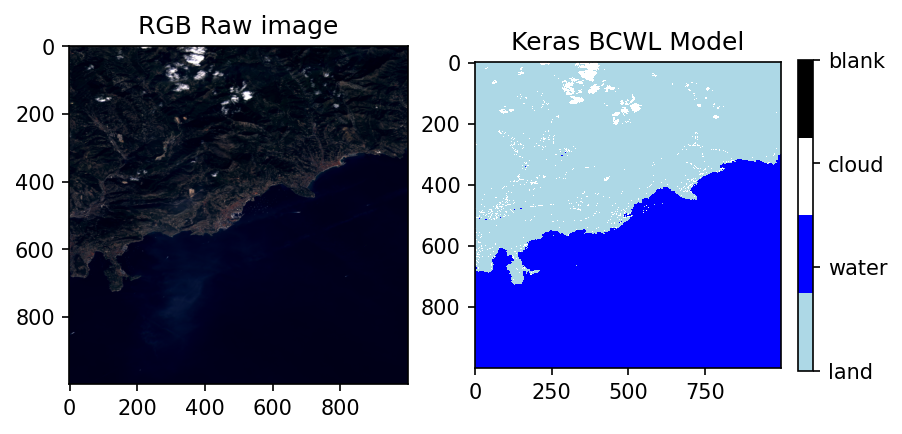

Reached the limit of 3 predictions for 7_427186937355526-43_73579381616672. Moving to the next location.
Finished processing location: 7_427186937355526-43_73579381616672


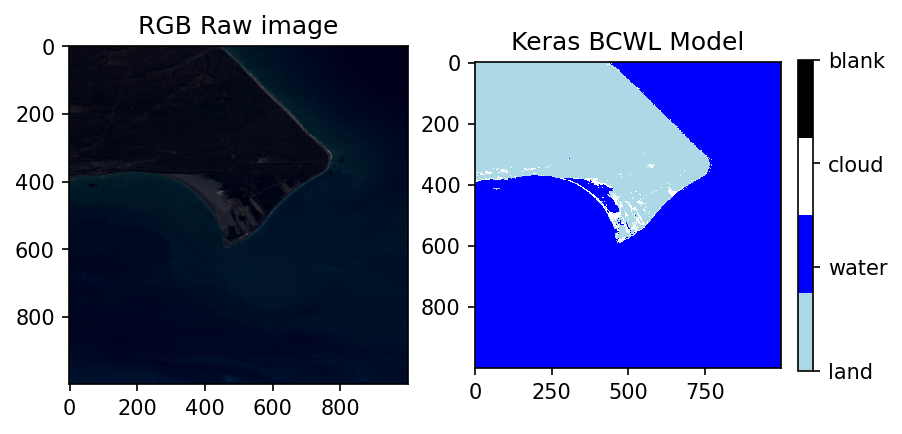

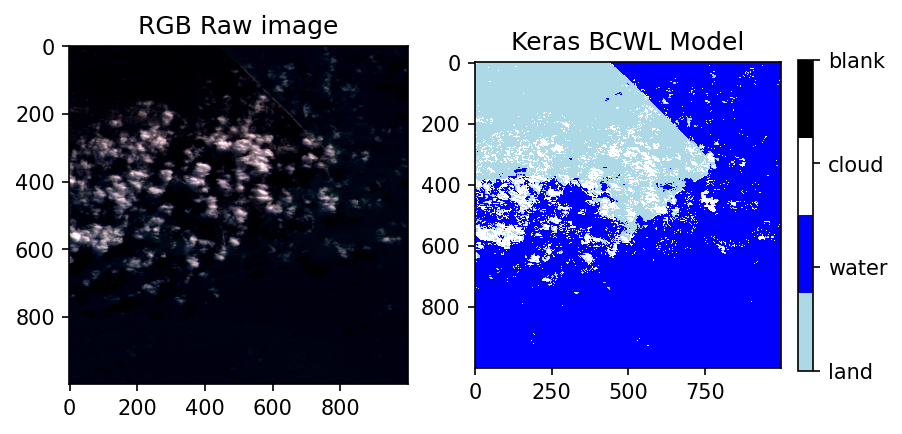

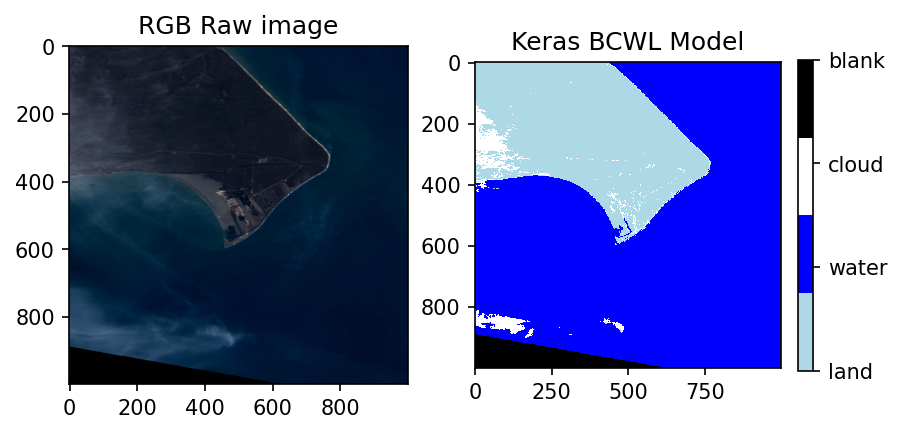

Reached the limit of 3 predictions for -68_42393854380919--52_3717759271713. Moving to the next location.
Finished processing location: -68_42393854380919--52_3717759271713


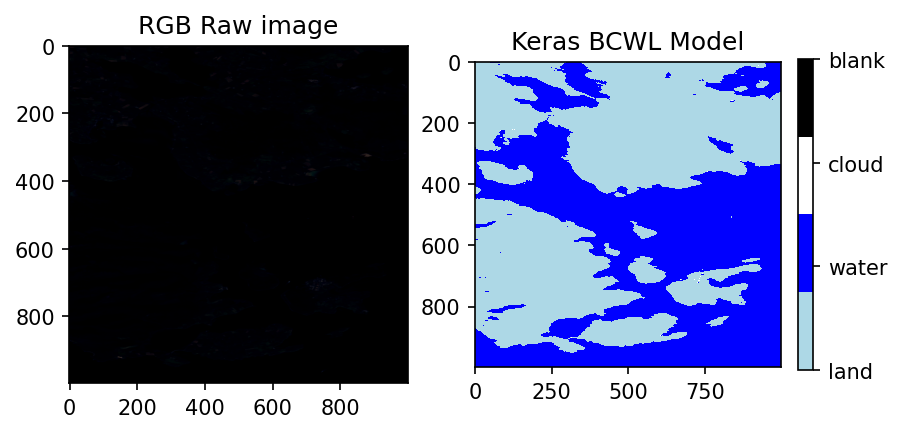

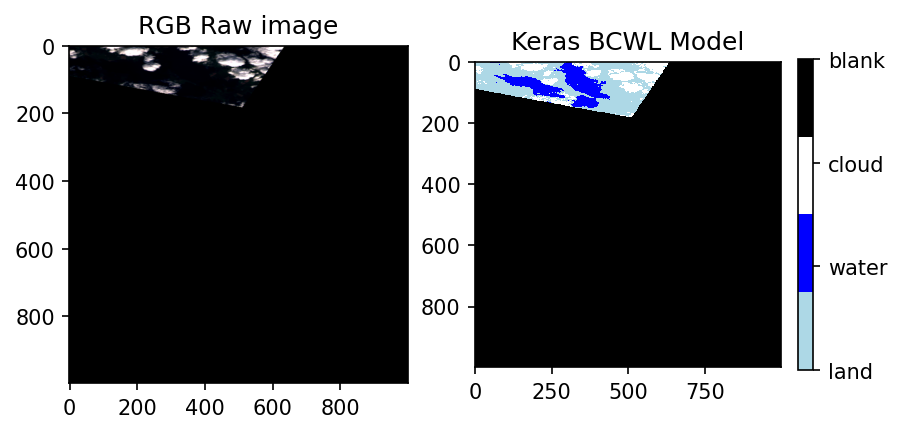

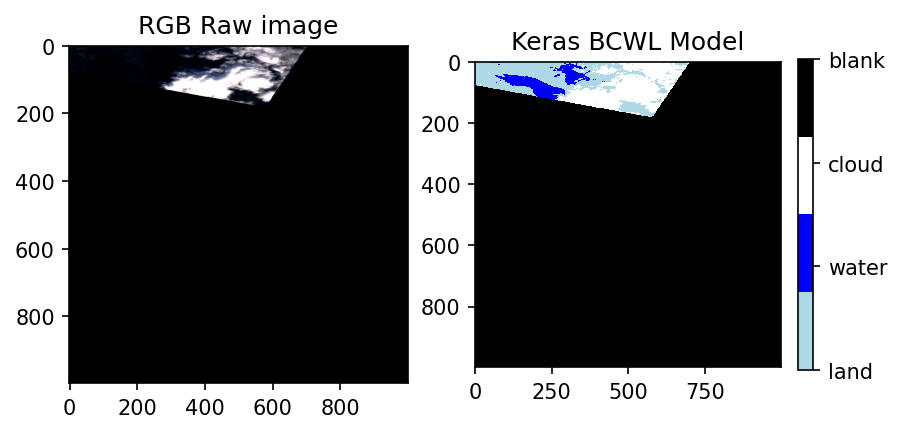

Reached the limit of 3 predictions for -3_1818755342010863-58_89384762193649. Moving to the next location.
Finished processing location: -3_1818755342010863-58_89384762193649


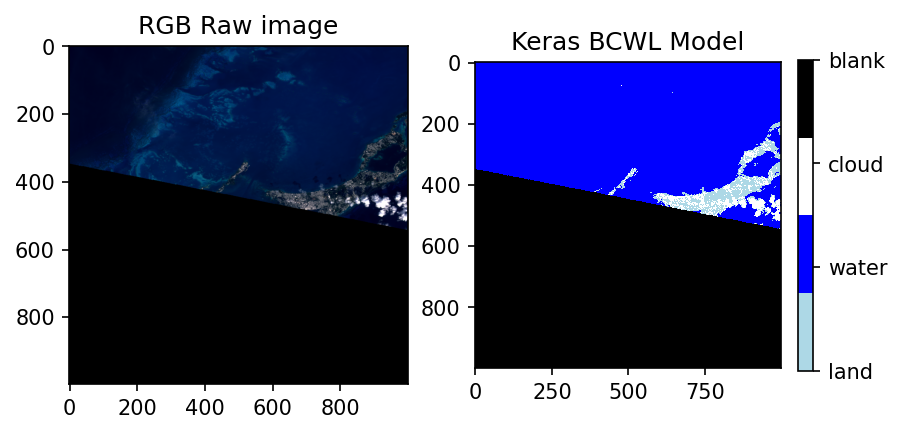

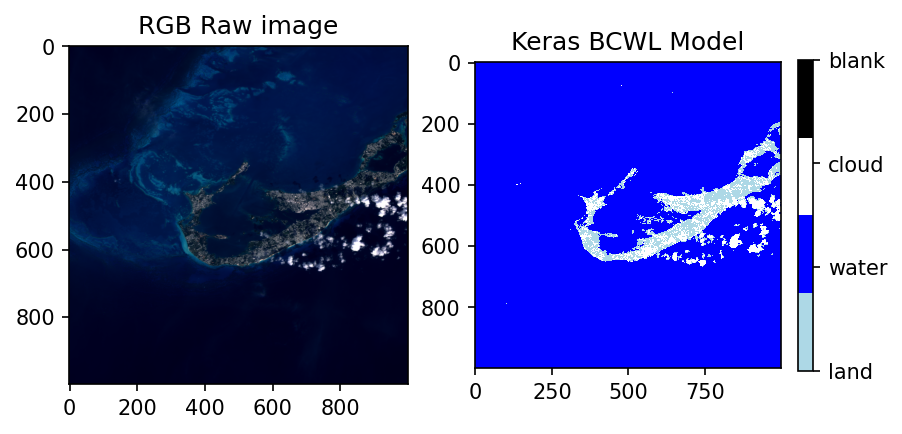

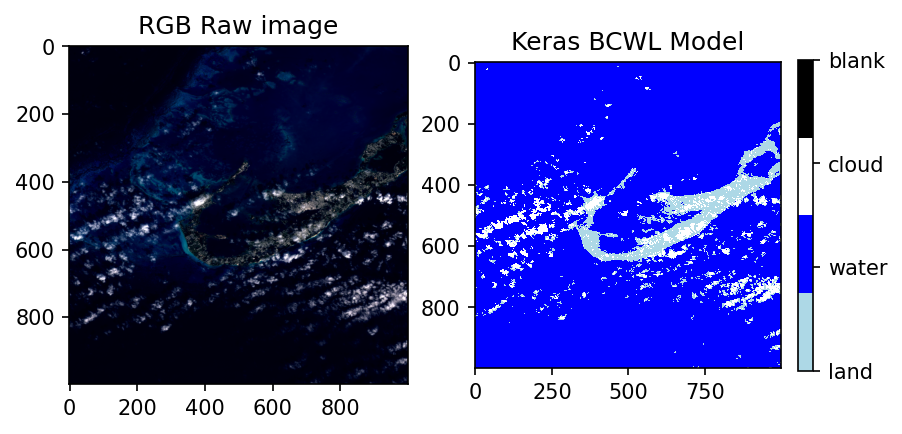

Finished processing location: -64_83918968090353-32_288573767151256


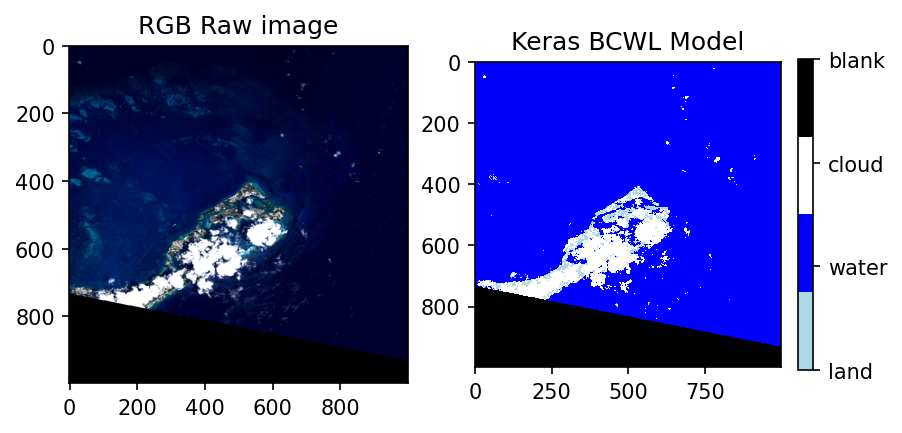

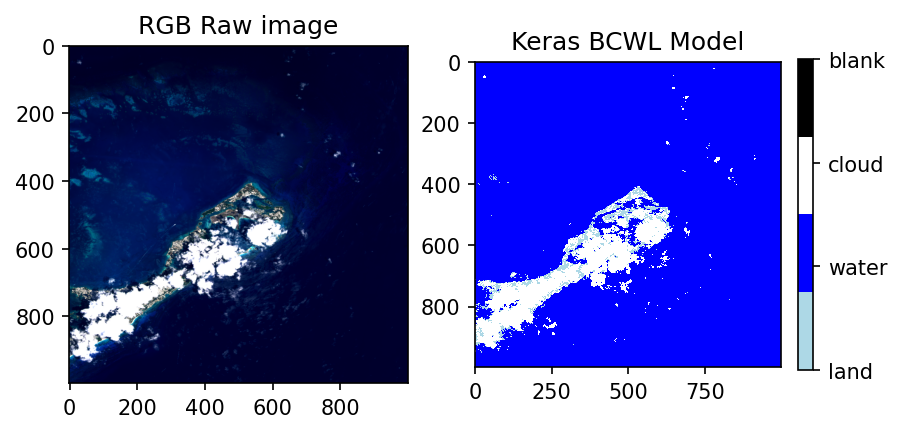

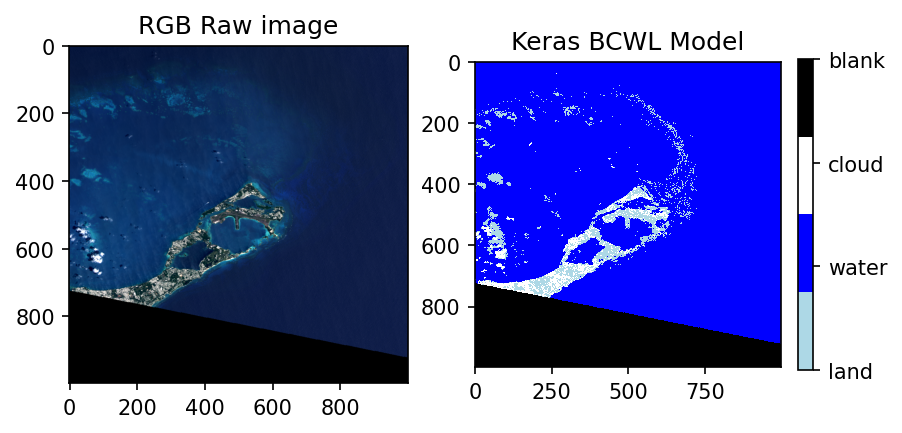

Reached the limit of 3 predictions for -64_68469327588889-32_3661421887762. Moving to the next location.
Finished processing location: -64_68469327588889-32_3661421887762


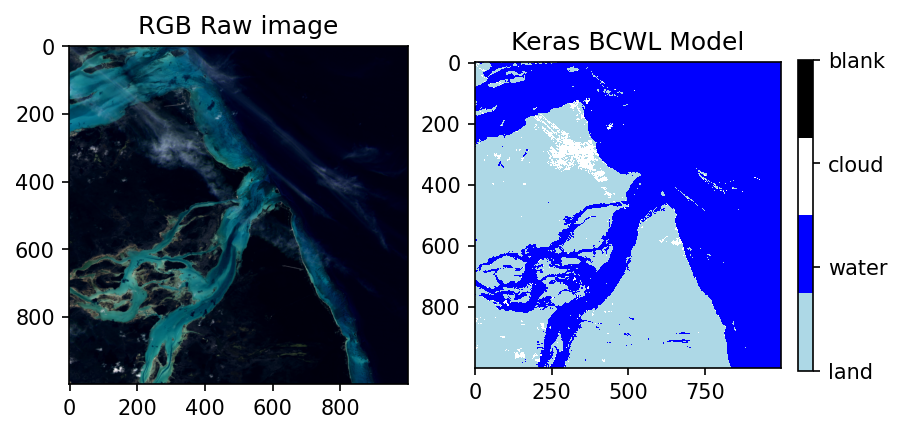

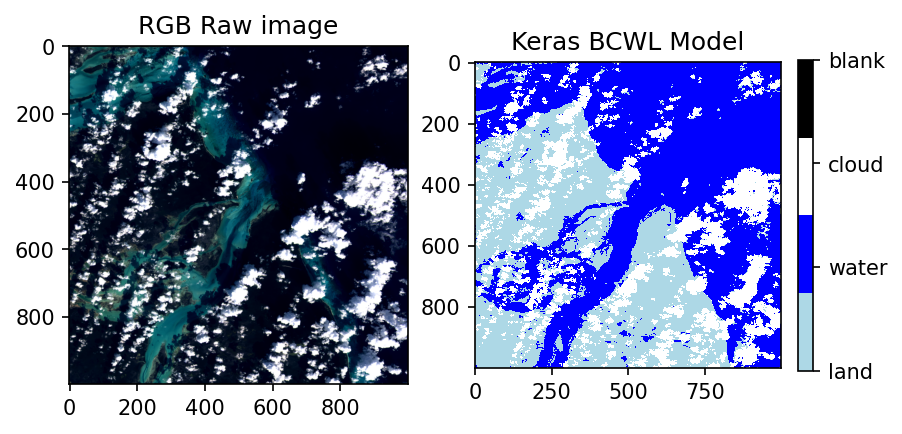

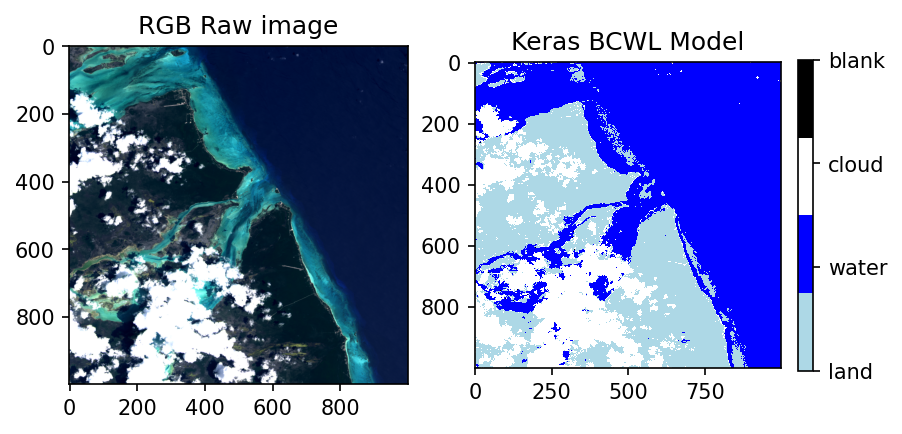

Finished processing location: -77_6329925155949-24_200914841362284


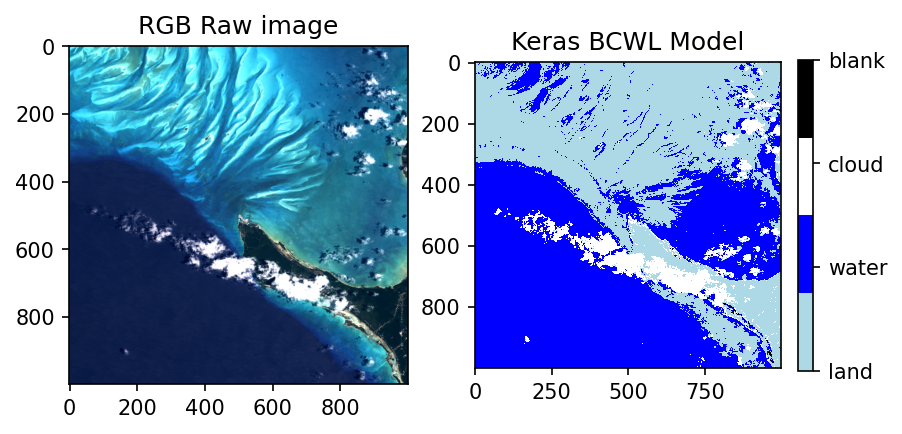

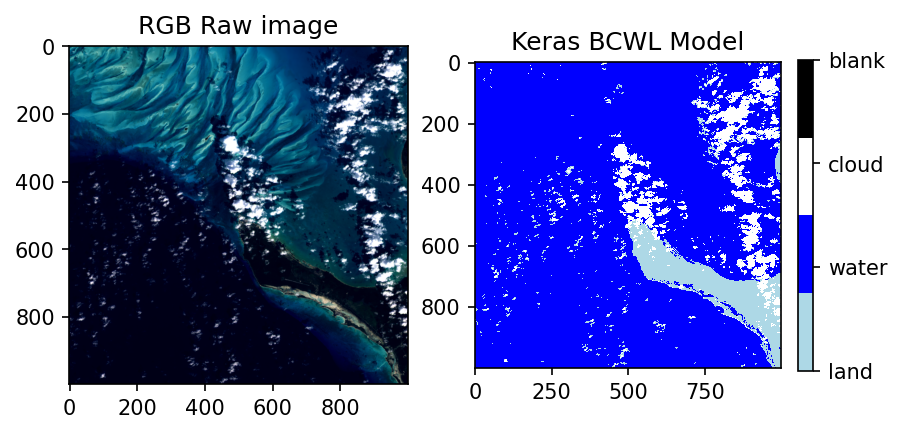

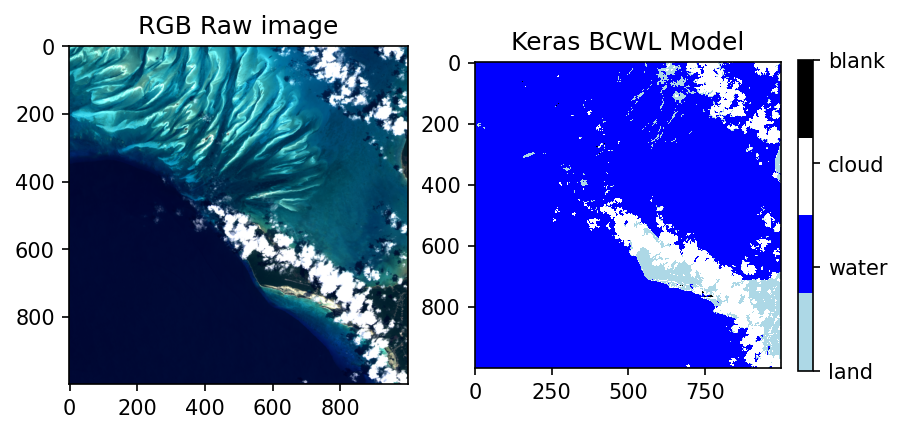

Finished processing location: -76_34514782080724-24_84063430131318


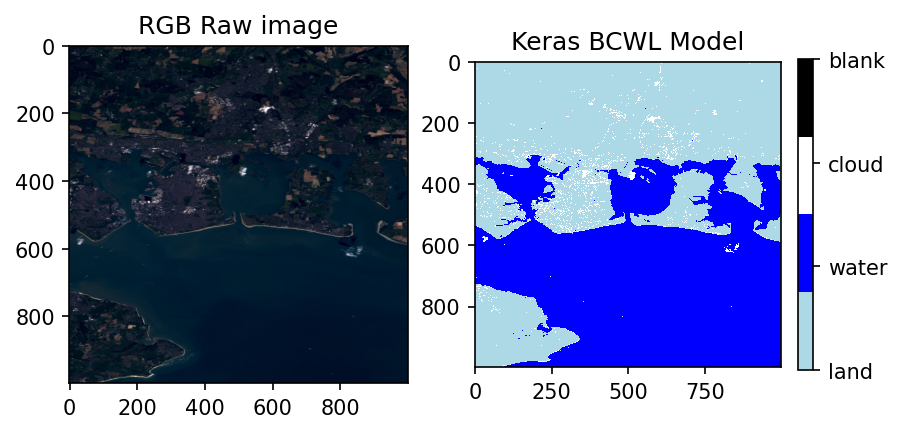

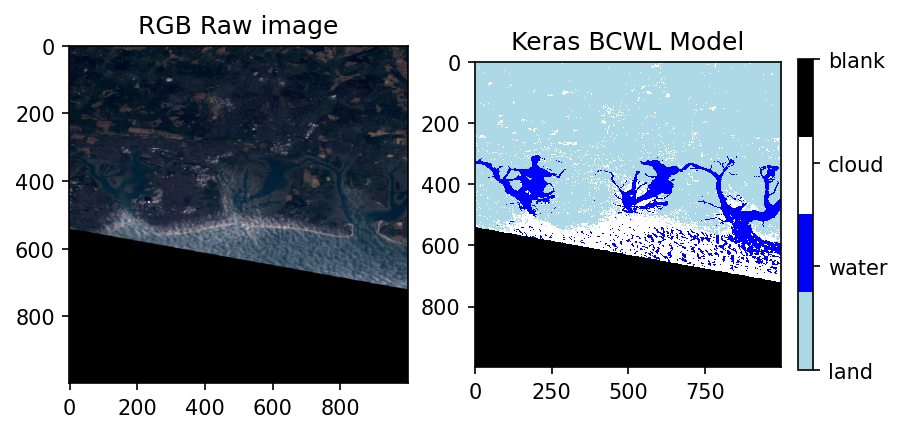

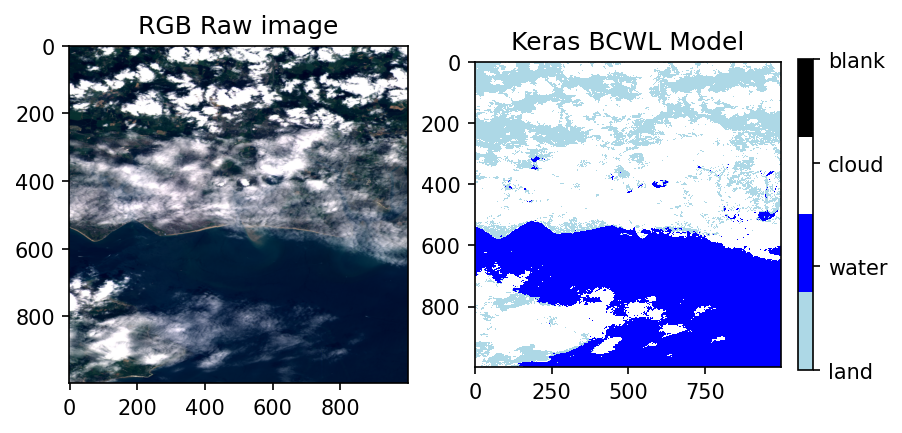

Finished processing location: -1_026789703493243-50_79504676942367


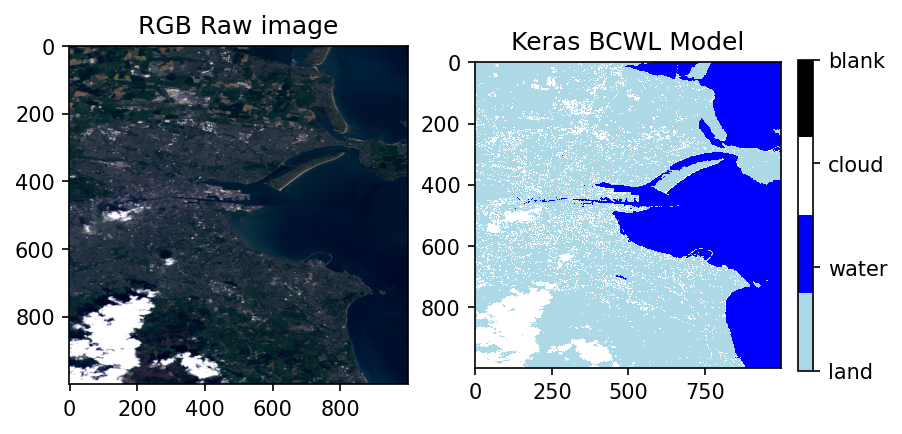

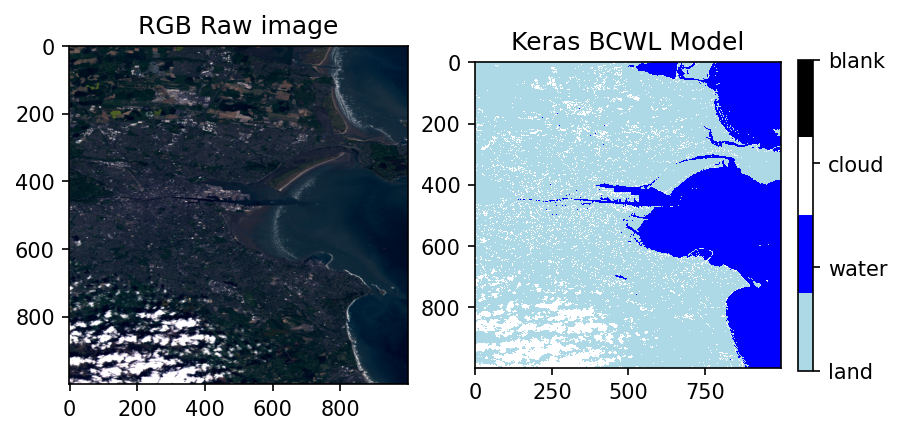

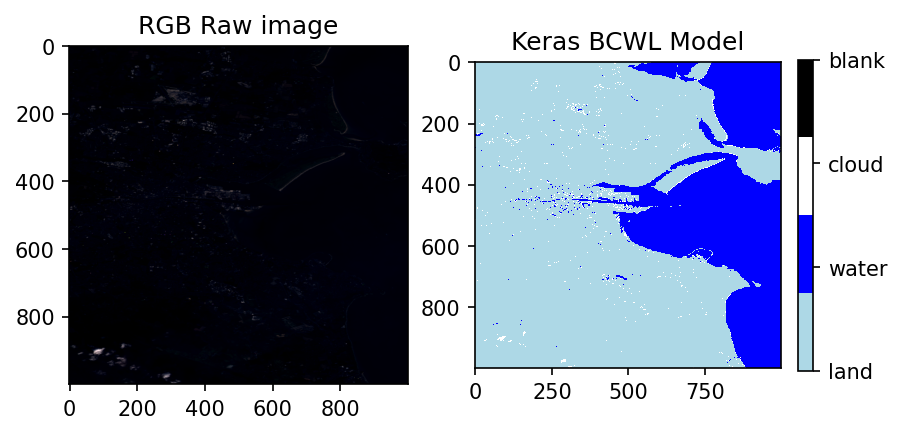

Reached the limit of 3 predictions for -6_198231749356554-53_33380672998807. Moving to the next location.
Finished processing location: -6_198231749356554-53_33380672998807


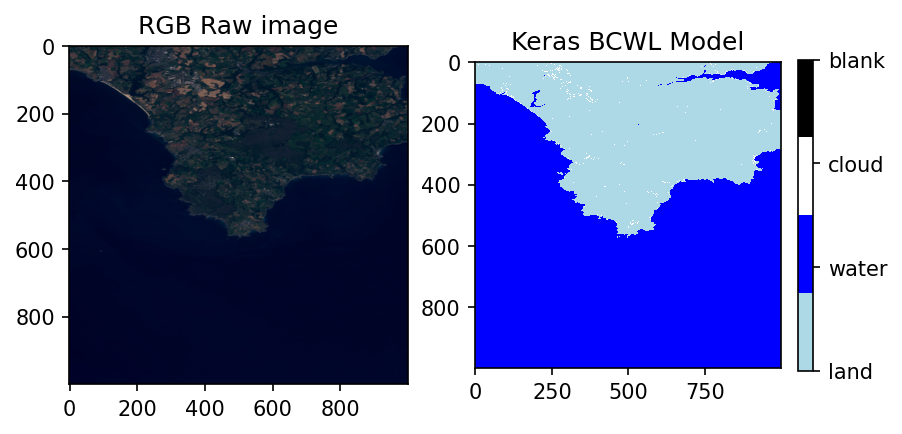

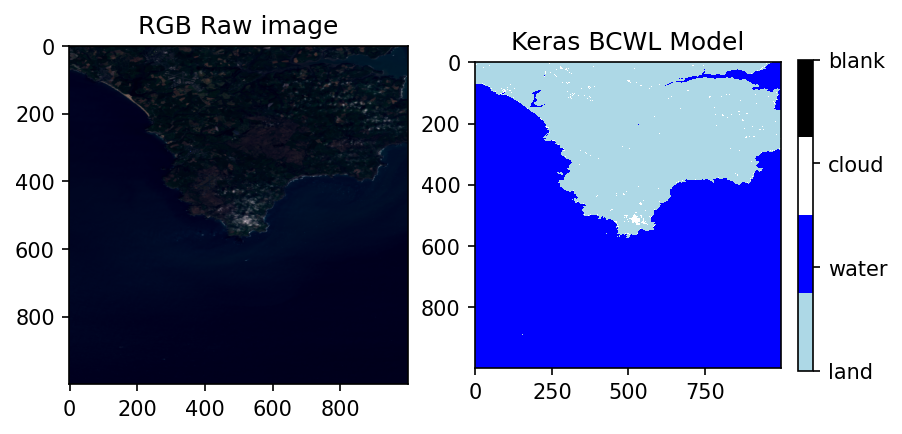

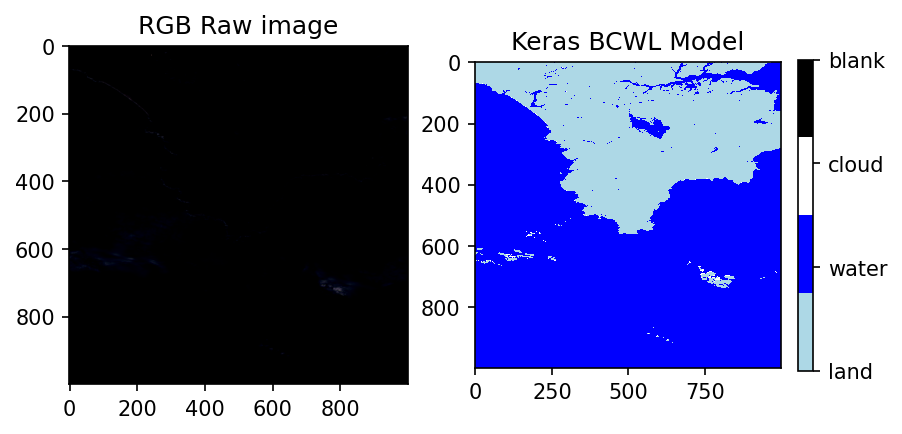

Finished processing location: -5_2076112989010594-49_97617994643231


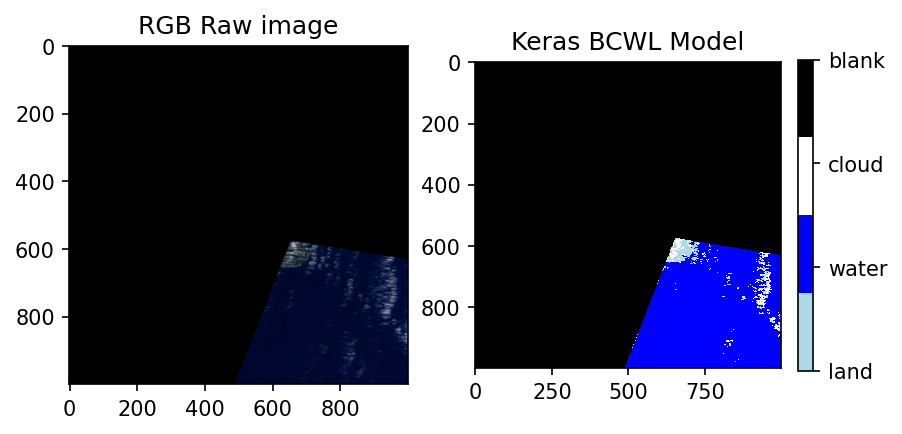

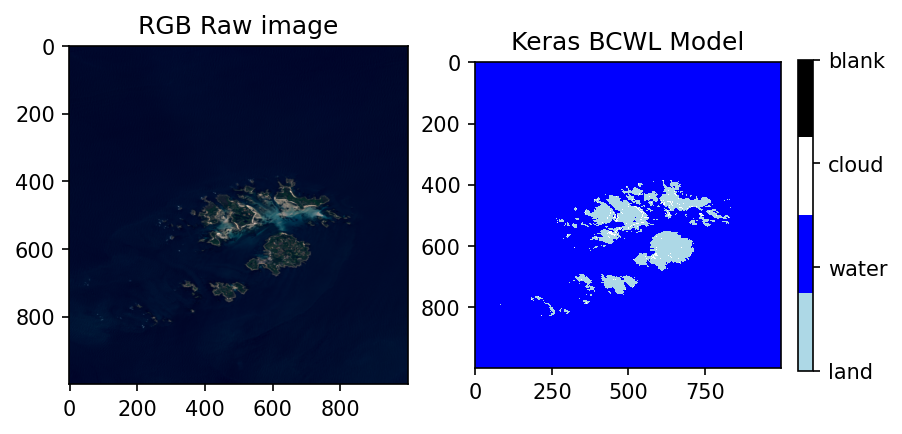

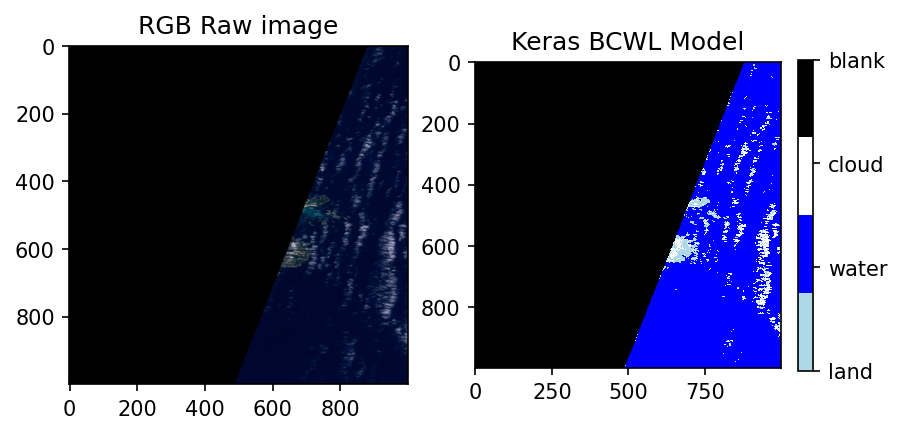

Finished processing location: -6_3335387696475625-49_952156341647324


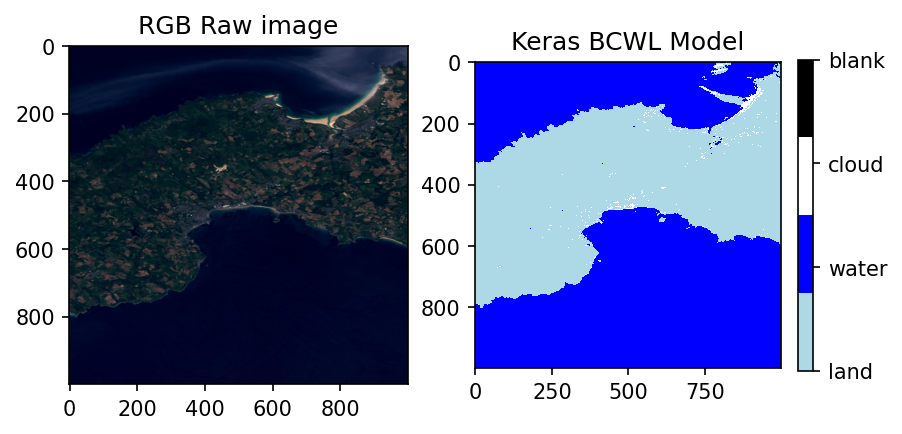

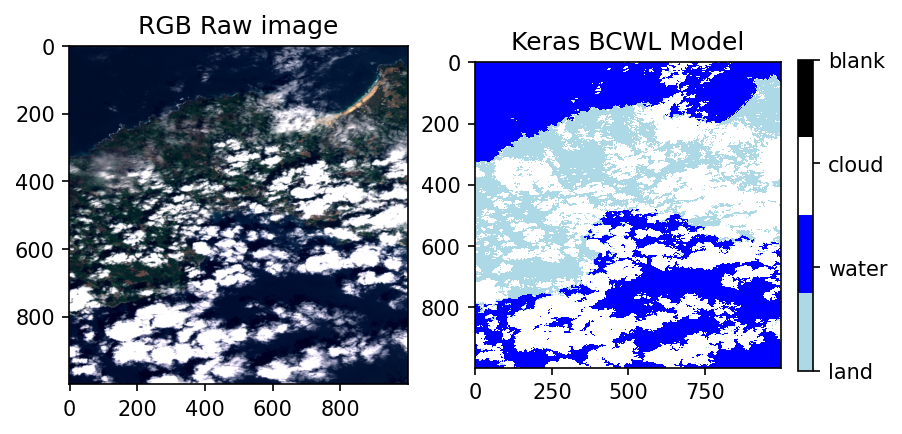

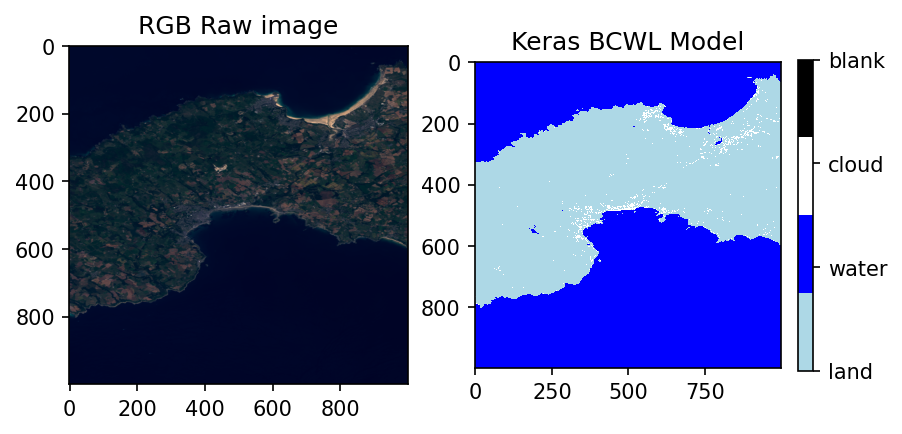

Finished processing location: -5_507542225567729-50_1220060877041
Finished processing location: 50_68440359993335--1_9547852908433536


In [18]:
plot_prediction('/content/drive/MyDrive/TinyML/Satellite/TestingSetAllFilters')